<a href="https://colab.research.google.com/github/YYC-CHUAN/dip-CTuse/blob/main/Inpainting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/YYC-CHUAN/dip-CTuse.git
!mv dip-CTuse/* ./

Cloning into 'dip-CTuse'...
remote: Enumerating objects: 447, done.
remote: Counting objects: 100% (132/132), done.
remote: Compressing objects: 100% (125/125), done.
remote: Total 447 (delta 78), reused 7 (delta 7), pack-reused 315 (from 2)
Receiving objects: 100% (447/447), 50.68 MiB | 13.74 MiB/s, done.
Resolving deltas: 100% (165/165), done.


In [2]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '1'

import numpy as np
from models.resnet import ResNet
from models.unet import UNet
from models.skip import skip
import torch
import torch.optim

from utils.inpainting_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

PLOT = True
imsize = -1
dim_div_by = 64

In [3]:
img_path  = 'data-new/Inpainting/liver2.jpg'
mask_path = 'data-new/Inpainting/kate_mask.png'

NET_TYPE = 'skip_depth6'

In [4]:
img_pil, img_np = get_image(img_path, imsize)
img_mask_pil, img_mask_np = get_image(mask_path, imsize)

In [5]:
img_mask_pil = crop_image(img_mask_pil, dim_div_by)
img_pil      = crop_image(img_pil,      dim_div_by)

img_np      = pil_to_np(img_pil)
img_mask_np = pil_to_np(img_mask_pil)

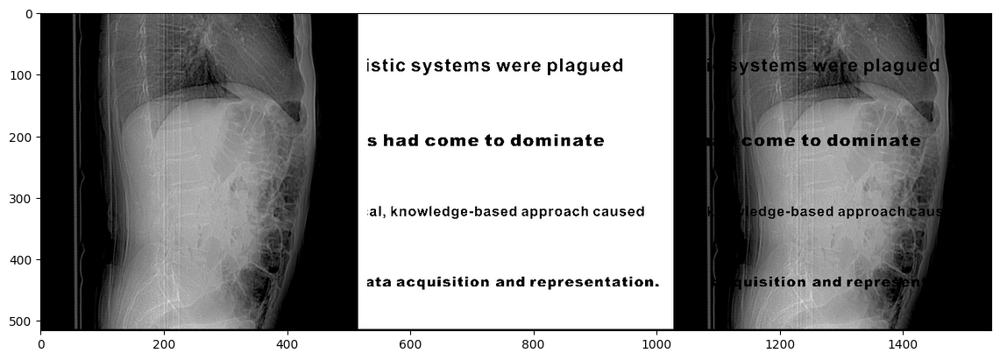

In [6]:
img_mask_var = np_to_torch(img_mask_np).type(dtype)

plot_image_grid([img_np, img_mask_np, img_mask_np*img_np], 3,11);

In [7]:
pad = 'reflection' # 'zero'
OPT_OVER = 'net'
OPTIMIZER = 'adam'

In [8]:
if ('liver2.jpg' in img_path):
    # Same params and net as in super-resolution and denoising
    INPUT = 'noise'
    input_depth = 32
    LR = 0.01
    num_iter = 6001
    param_noise = False
    show_every = 100
    figsize = 5
    reg_noise_std = 0.03

    net = skip(input_depth, img_np.shape[0],
               num_channels_down = [128] * 5,
               num_channels_up =   [128] * 5,
               num_channels_skip =    [128] * 5,
               filter_size_up = 3, filter_size_down = 3,
               upsample_mode='nearest', filter_skip_size=1,
               need_sigmoid=True, need_bias=True, pad=pad, act_fun='LeakyReLU').type(dtype)

else:
    assert False

net = net.type(dtype)
net_input = get_noise(input_depth, INPUT, img_np.shape[1:]).type(dtype)

In [9]:
# Compute number of parameters
s  = sum(np.prod(list(p.size())) for p in net.parameters())
print ('Number of params: %d' % s)

mse = torch.nn.MSELoss().type(dtype)

img_var = np_to_torch(img_np).type(dtype)
mask_var = np_to_torch(img_mask_np).type(dtype)

Number of params: 3002627


Starting optimization with ADAM


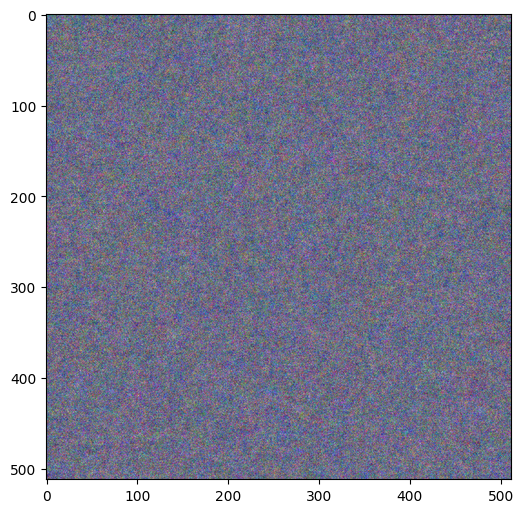

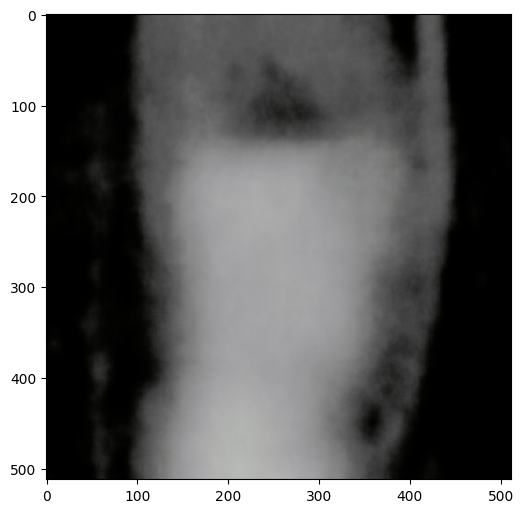

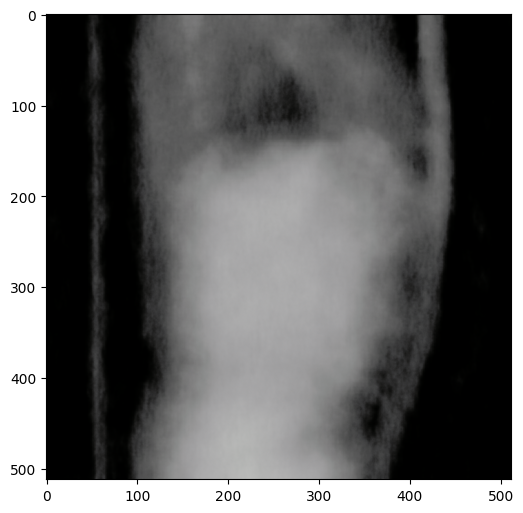

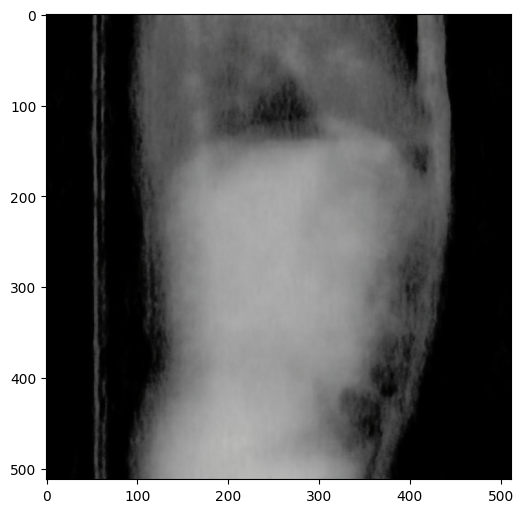

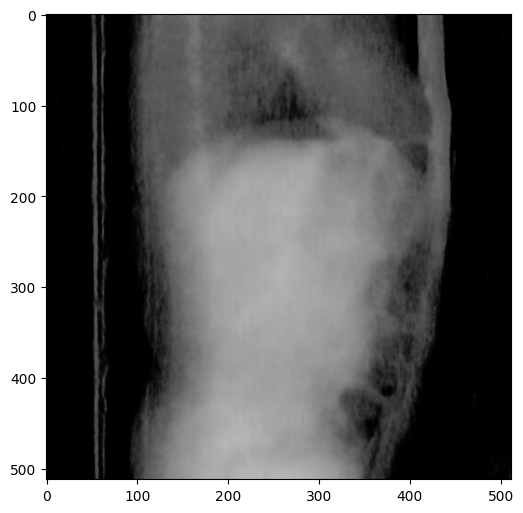

...

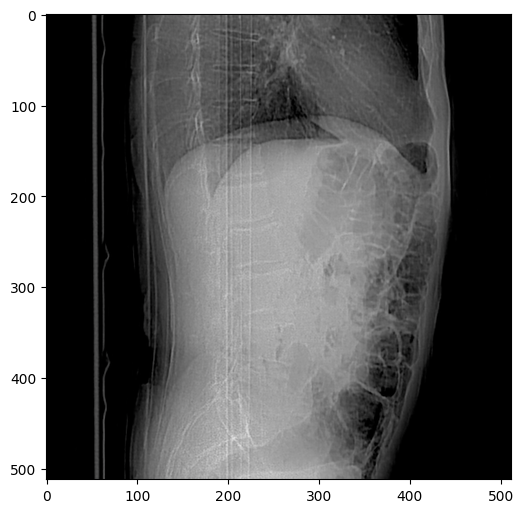

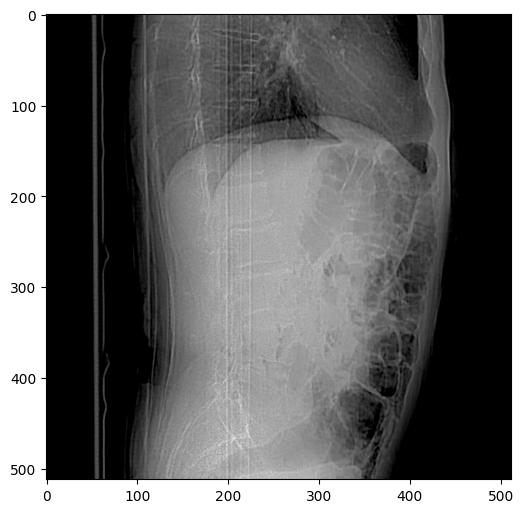

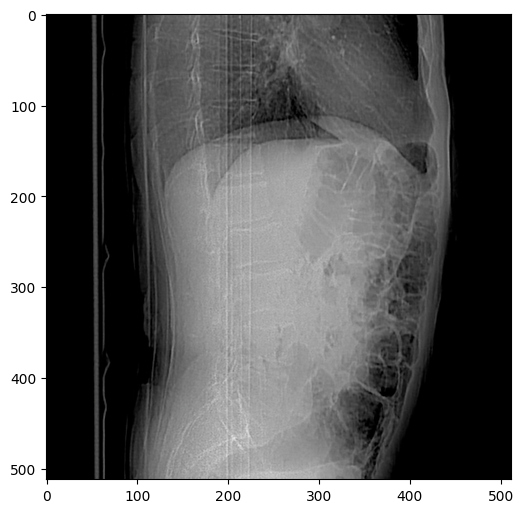

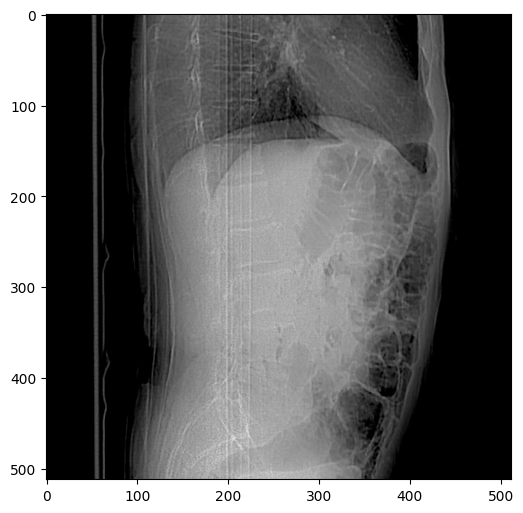

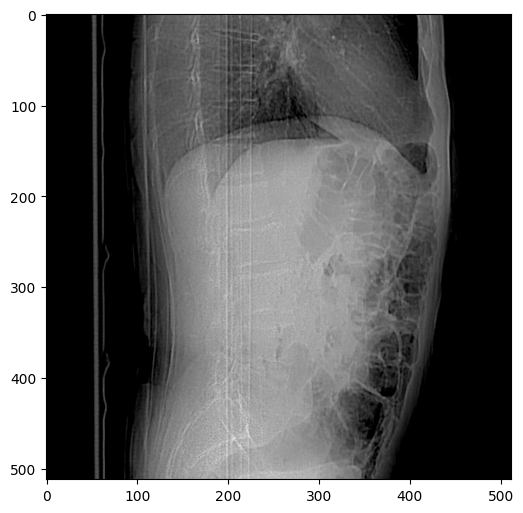

In [12]:
from skimage.metrics import peak_signal_noise_ratio as compare_psnr

def update_psnr_table(i, loss, psrn):
    df_new_row = {'Iteration': i, 'Loss': loss, 'PSNR': psrn}
    # df_psnr_history = df_psnr_history.append(df_new_row, ignore_index=True)



i = 0
def closure():

    global i

    if param_noise:
        for n in [x for x in net.parameters() if len(x.size()) == 4]:
            n = n + n.detach().clone().normal_() * n.std() / 50

    net_input = net_input_saved
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)


    out = net(net_input)

    total_loss = mse(out * mask_var, img_var * mask_var)
    total_loss.backward()

    psrn = compare_psnr(img_np, out.detach().cpu().numpy()[0])


    print ('Iteration %05d    Loss %f' % (i, total_loss.item()), '\r', end='')


    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        plot_image_grid([np.clip(out_np, 0, 1)], factor=figsize, nrow=1)

    i += 1



net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

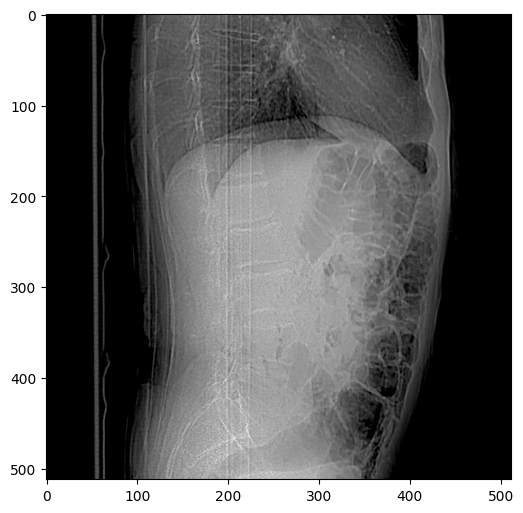

In [13]:
out_np = torch_to_np(net(net_input))
plot_image_grid([out_np], factor=5);